# Image Colorizer with DeOldify

**DeOldify is a projet to colorize and restore old images and film footage.**<br>

> All credits: https://github.com/jantic/DeOldify

DeOldify is a **Black and White image Colorizing library created by Jason Antic**. DeOldify introduced the NoGAN technique to solve some of the key problems to make hyper-realistic colorization images and video. DeOldify provides **three primary models for different use case**.

Each of these has some limitations and benefit:

#### Artistic Model
This model achieves **vibrant color and detailed images**, but you have to adjust the parameters a lot to get the best results. You have to adjust the rendering resolution and factors to get the most accurate colorize image.

The model uses a **resnet34 backbone on a UNet** with an emphasis on the depth of layers on the decoder side. And it is trained on five critic pretrain/GAN cycle repeats via NoGAN.

#### Stable Model 
This model archives the **best results in portraits and landscapes**. It makes sure nothing got too much colored and makes the most part of the image remain gray like faces and limbs. It is less hyper-realistic but it makes sure nothing looks more colored.

It uses a **resnet101 backbone on a UNet** with an emphasis on the width of layers on the decoder side.

#### Video Model
As the name suggests, it is a model used to **color the videos** and we are going to see each of these models working in a python environment. It gives smooth, consistent, and flicker-free Video. This model is the same as a stable model in the case of architecture but different in training. **DeOldify is trained on 2.2% of Imagenet dataset once at 192px, using only the initial generator/critic pretrain/GAN NoGAN training.**

In [1]:
import cv2
import datetime
import fastai
import ipywidgets as widgets
import json
import logging
import matplotlib.pyplot as plt
import os
import platform
import psutil
import re
import socket
import sys
import time
import torch
import uuid
import urllib
import urllib.request
import warnings

warnings.filterwarnings("ignore",
                        category=UserWarning,
                        message=".*?Your .*? set is empty.*?")

from pathlib import Path

%matplotlib inline

In [2]:
try:
    from moviepy.editor import *

except:
    !pip install moviepy
    from moviepy.editor import *

In [3]:
print("Python version:", sys.version)
print("PyTorch version:", torch.__version__)

Python version: 3.8.5 (default, Sep  4 2020, 07:30:14) 
[GCC 7.3.0]
PyTorch version: 1.11.0+cu113


In [4]:
import azureml.core
print("Azure ML :", azureml.core.VERSION)

Azure ML : 1.44.0


In [5]:
print(datetime.datetime.now())

2022-10-24 08:59:58.184372


## 1. Settings

In [6]:
if not Path("DeOldify").is_dir():
    print("Cloning DeOldify git...")
    !git clone https://github.com/jantic/DeOldify.git DeOldify
    print("\nDone")

else:
    print("Nothing to do. Deoldify directory is present")

Nothing to do. Deoldify directory is present


In [7]:
!ls DeOldify

ColorFIDBenchmarkArtistic.ipynb		VideoColorizer.ipynb
ColorizeTrainingArtistic.ipynb		VideoColorizerColab.ipynb
ColorizeTrainingStable.ipynb		deoldify
ColorizeTrainingStableLargeBatch.ipynb	environment.yml
ColorizeTrainingVideo.ipynb		fastai
ColorizeTrainingWandb.ipynb		fid
ImageColorizer.ipynb			requirements-colab.txt
ImageColorizerArtisticTests.ipynb	requirements-dev.txt
ImageColorizerColab.ipynb		requirements.txt
ImageColorizerColabStable.ipynb		resource_images
ImageColorizerStableTests.ipynb		result_images
JFK.jpg					setup.py
LICENSE					test_images
MANIFEST.in				tox.ini
README.md				video


In [8]:
# Installation of ffmpeg is required for the video model
#!sudo apt-get install ffmpeg -y

In [9]:
# Installation of the required librairies(one time only - then restart the kernel!)
#!pip install -r DeOldify/requirements.txt

In [10]:
os.chdir("DeOldify")

In [11]:
# Import some deoldify ressources
from deoldify import device
from deoldify.device_id import DeviceId
from deoldify.visualize import *

device.set(device=DeviceId.GPU0)

torch.backends.cudnn.benchmark = True

## 2. Environment

In [12]:
def get_system_info():
    """
    Get system information
    """
    try:
        info = {}
        info['Platform'] = platform.system()
        info['Platform-release'] = platform.release()
        info['Platform-version'] = platform.version()
        info['Architecture'] = platform.machine()
        info['Hostname'] = socket.gethostname()
        info['IP-address'] = socket.gethostbyname(socket.gethostname())
        info['MAC-address'] = ':'.join(
            re.findall('..', '%012x' % uuid.getnode()))
        info['Processeur'] = platform.processor()
        info['RAM'] = str(round(psutil.virtual_memory().total /
                                (1024.0**3))) + " Gb"

        return json.dumps(info)

    except Exception as e:
        logging.exception(e)

In [13]:
json.loads(get_system_info())

{'Platform': 'Linux',
 'Platform-release': '5.15.0-1017-azure',
 'Platform-version': '#20~20.04.1-Ubuntu SMP Fri Aug 5 12:16:53 UTC 2022',
 'Architecture': 'x86_64',
 'Hostname': 'standardnc24sv3',
 'IP-address': '127.0.0.1',
 'MAC-address': 'e5:5a:80:18:11:37',
 'Processeur': 'x86_64',
 'RAM': '441 Gb'}

In [14]:
!nvidia-smi

Mon Oct 24 09:00:18 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.141.03   Driver Version: 470.141.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-PCIE...  On   | 00000001:00:00.0 Off |                    0 |
| N/A   21C    P0    24W / 250W |      4MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-PCIE...  On   | 00000002:00:00.0 Off |                    0 |
| N/A   

## 3. Model to download

In [19]:
!pwd

/mnt/batch/tasks/shared/LS_root/mounts/clusters/standardnc24sv3/code/Users/seretkow/ComputerVision/colorize/DeOldify


In [15]:
MODEL_DIR = "models"

In [16]:
if not os.path.exists(MODEL_DIR):
    print("Dir:", MODEL_DIR, "does not exist")
    print("Let's create dir:", MODEL_DIR)
    os.mkdir(MODEL_DIR)
    print("Done.")

else:
    print("Dir:", MODEL_DIR, "exist. So let's use it")

Dir: models does not exist
Let's create dir: models
Done.


In [17]:
model_url = "https://huggingface.co/databuzzword/deoldify-stable/resolve/main/ColorizeStable_gen.pth"

os.chdir("models")
model_file="ColorizeStable_gen.pth"

try:
    print("Downloading the Stable model...")
    urllib.request.urlretrieve(model_url, filename=model_file)
    os.chdir("..")
    print("Done")

except:
    os.chdir('..')
    print("[Error] Cannot download the Standard model from:", model_url)

Done


In [18]:
!ls models/ColorizeStable_gen.pth -lh

-rwxrwxrwx 1 root root 834M Oct 24 09:00 models/ColorizeStable_gen.pth


## 4. Python functions to download some test images and to colorize

In [20]:
def download_image_from_url(myurl, mylocalimage, imgview=True, axis=False):
    """
    Download an image from an url and can display it
    """
    request = requests.get(myurl)

    if request.status_code == 200:
        print("\033[1;31;34mDownloading image from:", myurl)
        urllib.request.urlretrieve(myurl, mylocalimage)
        print("Done. Local image is available:", mylocalimage)

    if imgview:
        plt.figure(figsize=(10, 7))
        if axis:
            plt.axis("on")
        plt.axis("off")
        plt.title("Image: " + mylocalimage)
        plt.imshow(cv2.cvtColor(cv2.imread(mylocalimage), cv2.COLOR_BGR2RGB))

    else:
        print("Error. Check url")

In [21]:
def image_colorizer(myurl, render_factor=35, watermarked=True, compare=True):
    """
    Colorizer function
    """
    print("\033[1;31;34mLet's colorize the image...\n")
    request = requests.get(myurl)
    start = time.time()

    try:
        if request.status_code != 200:
            print("Error: url is not valid")
            exit

        else:
            image_path = colorizer.plot_transformed_image_from_url(
                url=myurl,
                render_factor=render_factor,
                compare=compare,
                watermarked=watermarked)

            print("Done in", round(time.time() - start, 2),
                  "seconds with render_factor value =", render_factor)
            show_image_in_notebook(image_path)

            return image_path

    except:
        print("[Error] Try again")

In [22]:
def save_results(imgfile):
    """
    Save results into a single image file
    """
    outputfile = '../colorized_' + imgfile
    print("\033[1;31;34mSaving image results into:", outputfile)

    img_hconcat = cv2.hconcat(
        [cv2.imread(imgfile),
         cv2.imread('result_images/image.png')])

    cv2.imwrite(outputfile, img_hconcat)
    print("Done.")

## 5. Testing with the standard model

In [23]:
url1 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture1.jpg?raw=true"
url2 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture2.jpg?raw=true"
url3 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture3.jpg?raw=true"
url4 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture4.jpg?raw=true"
url5 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture5.jpg?raw=true"
url6 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture6.jpg?raw=true"
url7 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture7.jpg?raw=true"
url8 = "https://github.com/retkowsky/colorizer/blob/main/oldpicture8.jpg?raw=true"

In [24]:
try:
    print("Loading the Standard model...")
    colorizer = get_image_colorizer(artistic=False)
    print("Done")

except:
    print("[Error] Cannot load the Standard model")

Loading the Standard model...
Done


### Example 1

Done. Local image is available: JFK.jpg


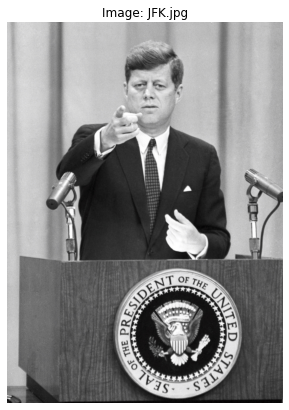

In [25]:
localfilename = 'JFK.jpg'
download_image_from_url(url1, localfilename)

Let's colorize the image...

Done in 2.51 seconds with render_factor value = 30


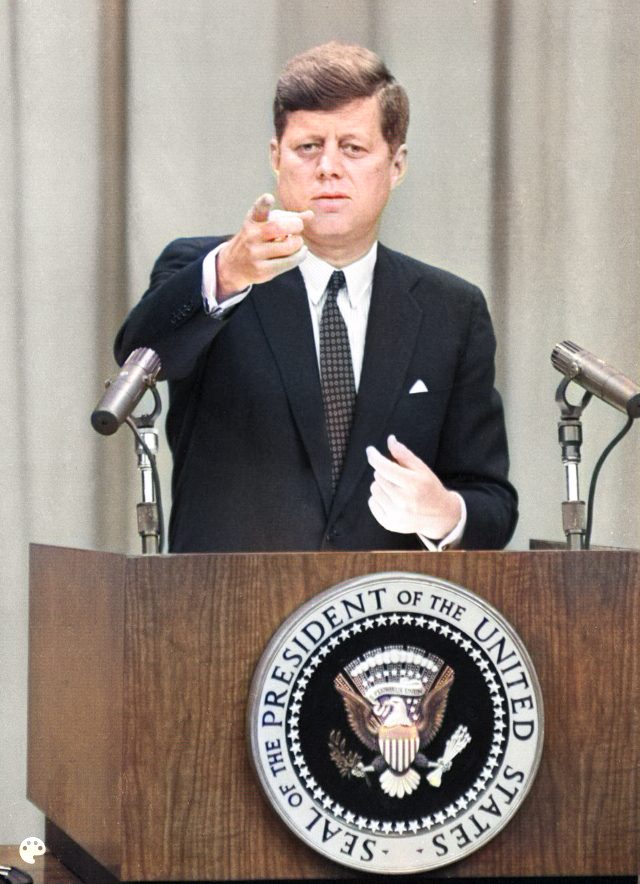

PosixPath('result_images/image.png')

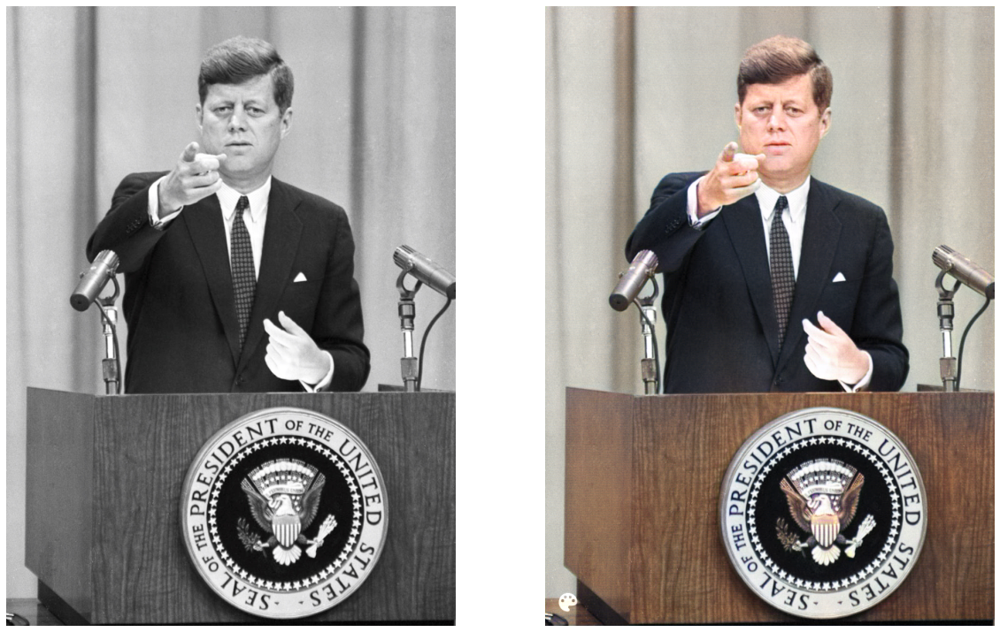

In [26]:
image_colorizer(url1, render_factor=30)

In [27]:
save_results(localfilename)

Saving image results into: ../colorized_JFK.jpg
Done.


### Example 2

Done. Local image is available: RobertDoisneau.jpg


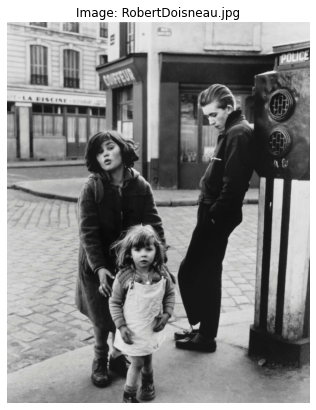

In [28]:
localfilename = 'RobertDoisneau.jpg'
download_image_from_url(url2, localfilename)

Let's colorize the image...

Done in 2.76 seconds with render_factor value = 35


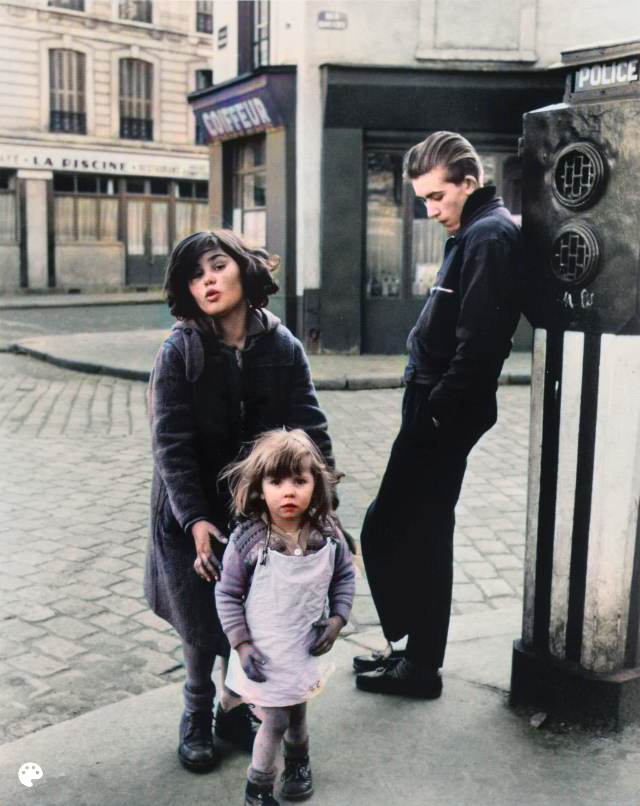

PosixPath('result_images/image.png')

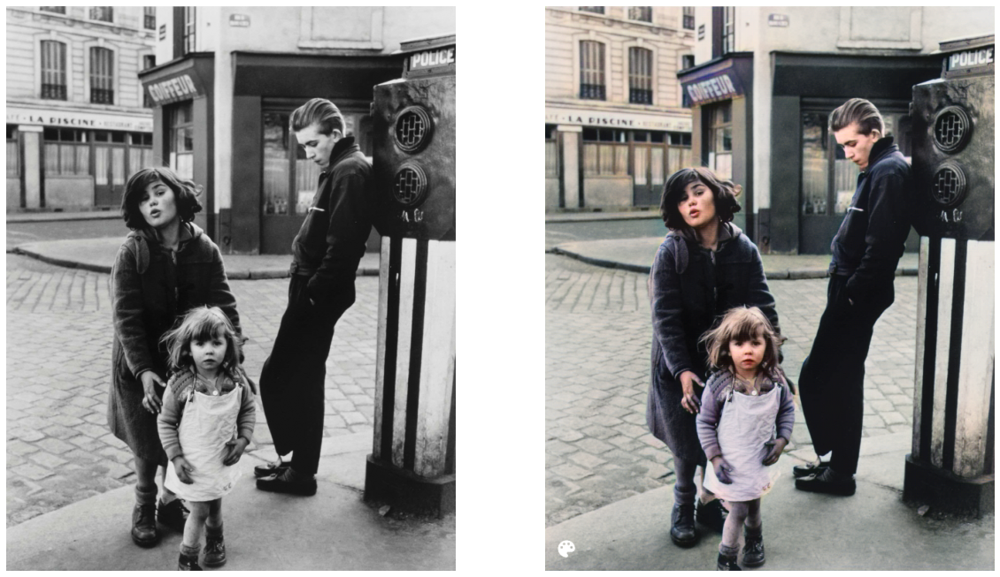

In [29]:
image_colorizer(url2, render_factor=35)

In [30]:
save_results(localfilename)

Saving image results into: ../colorized_RobertDoisneau.jpg
Done.


### Example 3

Done. Local image is available: ussoldiers.jpg


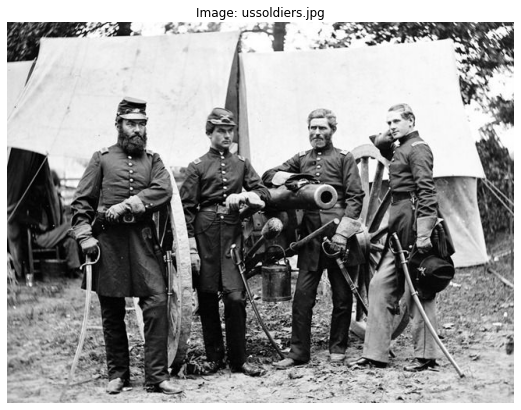

In [31]:
localfilename = "ussoldiers.jpg"
download_image_from_url(url6, localfilename)

Let's colorize the image...

Done in 4.0 seconds with render_factor value = 50


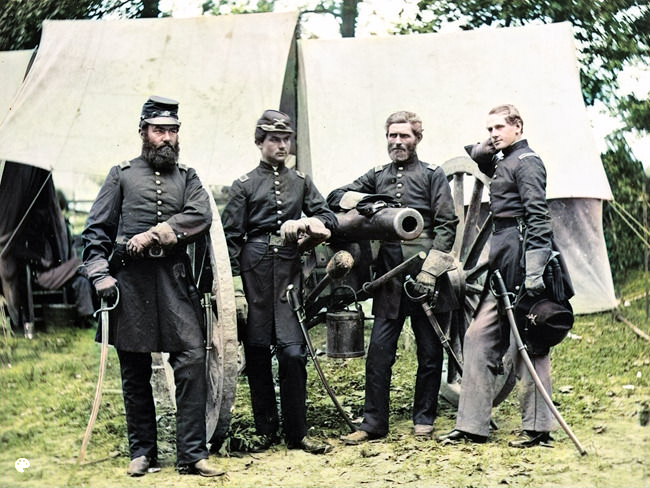

PosixPath('result_images/image.png')

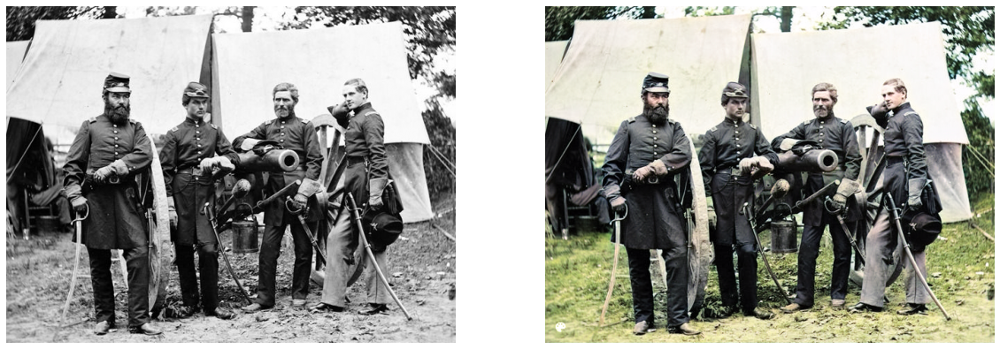

In [32]:
image_colorizer(url6, render_factor=50)

In [33]:
save_results(localfilename)

Saving image results into: ../colorized_ussoldiers.jpg
Done.


### Example 4

Done. Local image is available: DorotheaLange.jpg


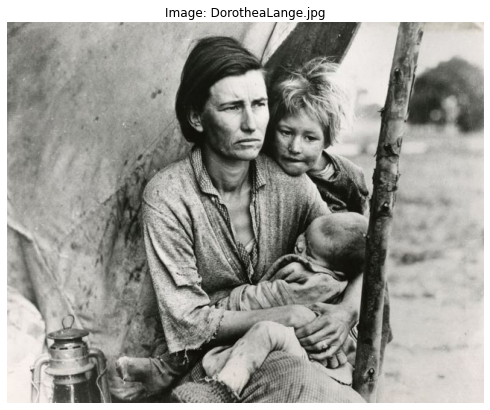

In [34]:
localfilename = "DorotheaLange.jpg"
download_image_from_url(url7, localfilename)

Let's colorize the image...

Done in 2.31 seconds with render_factor value = 28


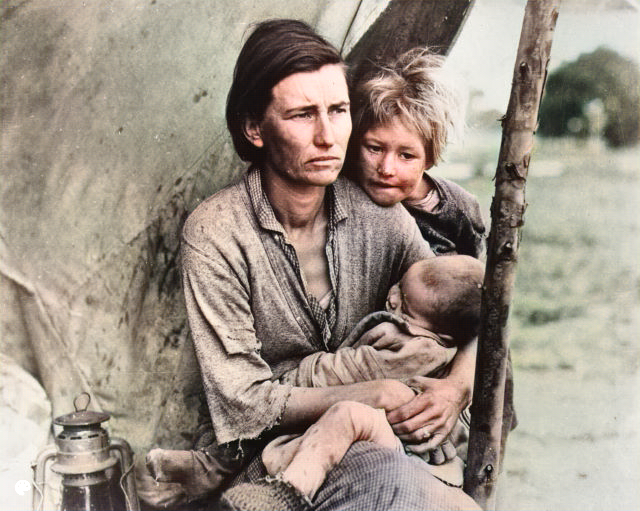

PosixPath('result_images/image.png')

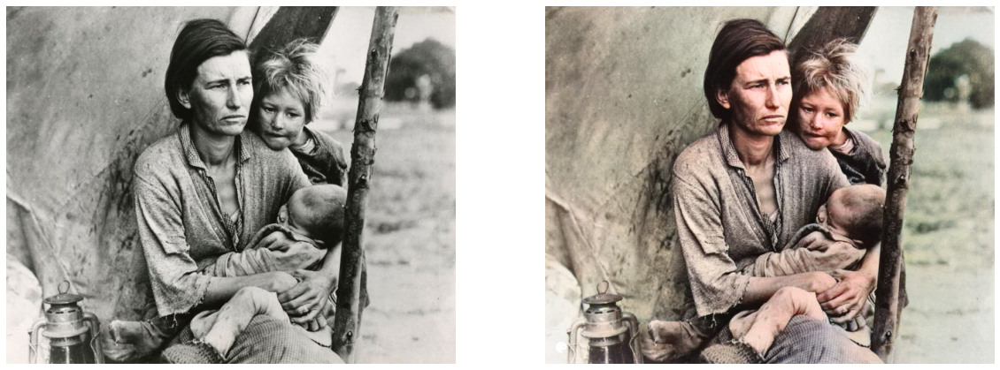

In [35]:
image_colorizer(url7, render_factor=28)

In [36]:
save_results(localfilename)

Saving image results into: ../colorized_DorotheaLange.jpg
Done.


### We can adjust the best render factor parameter value by testing multiple values.

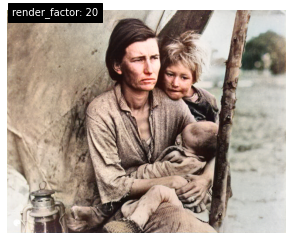

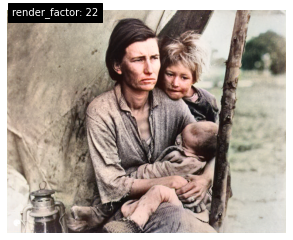

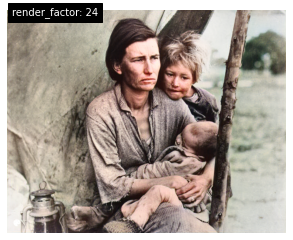

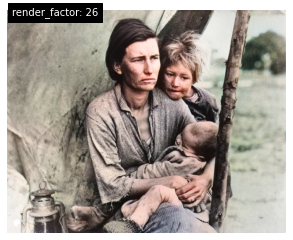

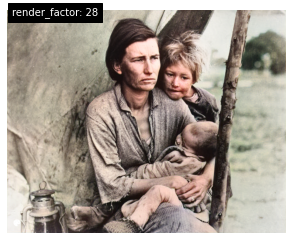

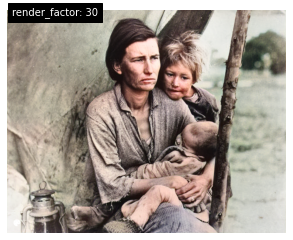

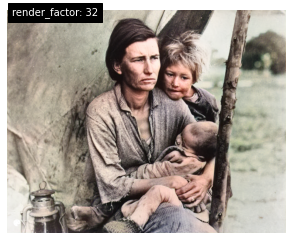

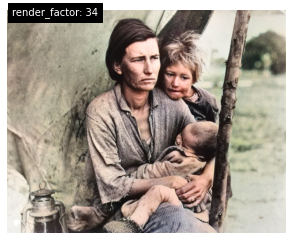

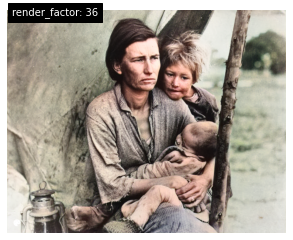

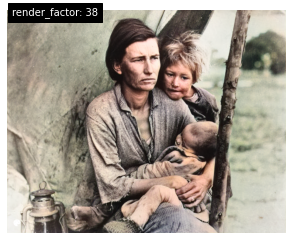

In [37]:
minval = 20
maxval = 40
step = 2

for render_factor_val in range(minval, maxval, step):
    colorizer.plot_transformed_image(localfilename,
                                     render_factor=render_factor_val,
                                     display_render_factor=True,
                                     figsize=(5, 5))

## 6. Testing with the artistic model

In [38]:
model_url = "https://huggingface.co/databuzzword/deoldify-artistic/resolve/main/ColorizeArtistic_gen.pth"

os.chdir("models")
model_file="ColorizeArtistic_gen.pth"

try:
    print("Downloading the Artistic model...")
    urllib.request.urlretrieve(model_url, filename=model_file)
    os.chdir("..")
    print("Done")

except:
    os.chdir('..')
    print("[Error] Cannot download the Artistic model from:", model_url)

Done


In [39]:
!ls models/ColorizeArtistic_gen.pth -lh

-rwxrwxrwx 1 root root 244M Oct 24 09:03 models/ColorizeArtistic_gen.pth


In [40]:
try:
    print("Loading the Artistic model...")
    colorizer = get_image_colorizer(artistic=True)
    print("Done")

except:
    print("[Error] Cannot load the Artistic model")

Loading the Artistic model...
Done


### Example 1

Done. Local image is available: NYC.jpg


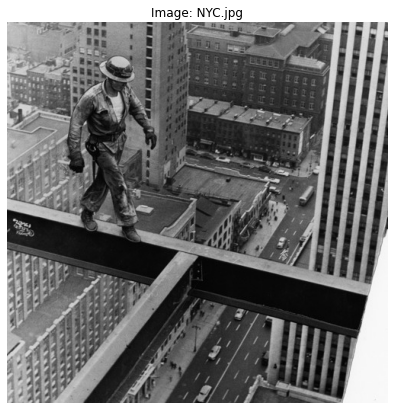

In [41]:
localfilename = "NYC.jpg"
download_image_from_url(url3, localfilename)

Let's colorize the image...

Done in 2.24 seconds with render_factor value = 30


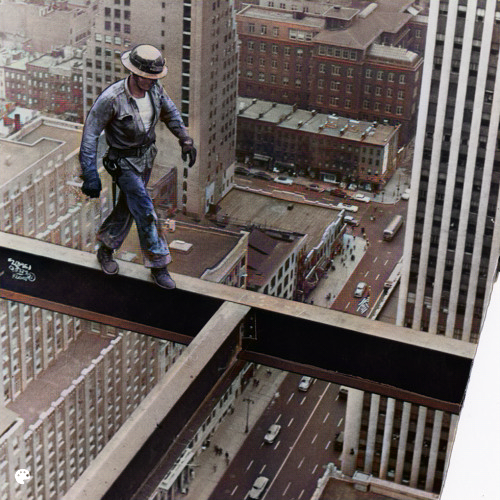

PosixPath('result_images/image.png')

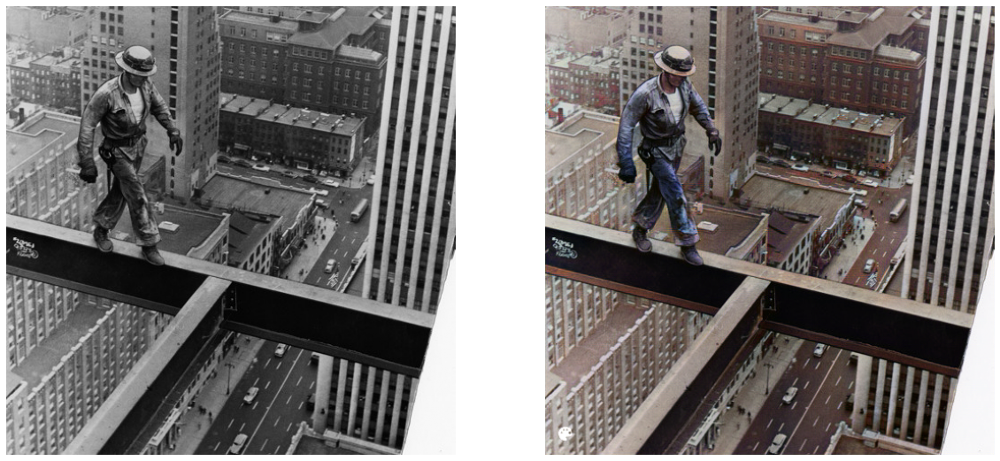

In [42]:
image_colorizer(url3, render_factor=30)

In [43]:
save_results(localfilename)

Saving image results into: ../colorized_NYC.jpg
Done.


### Example 2

Done. Local image is available: ParisBoulevard.jpg


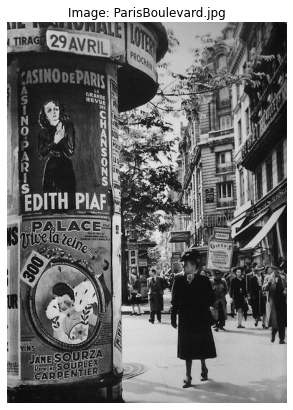

In [44]:
localfilename = "ParisBoulevard.jpg"
download_image_from_url(url4, localfilename)

Let's colorize the image...

Done in 2.11 seconds with render_factor value = 30


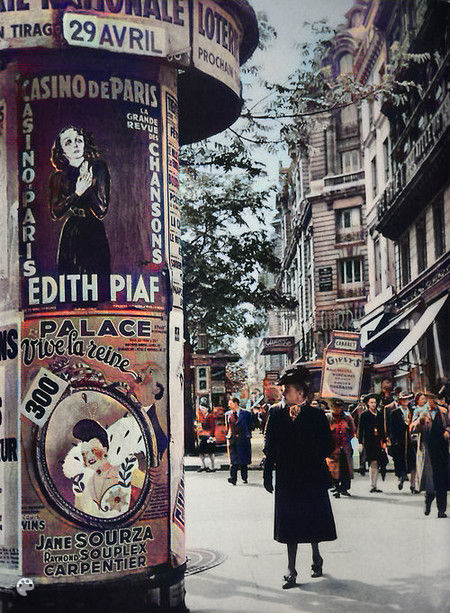

PosixPath('result_images/image.png')

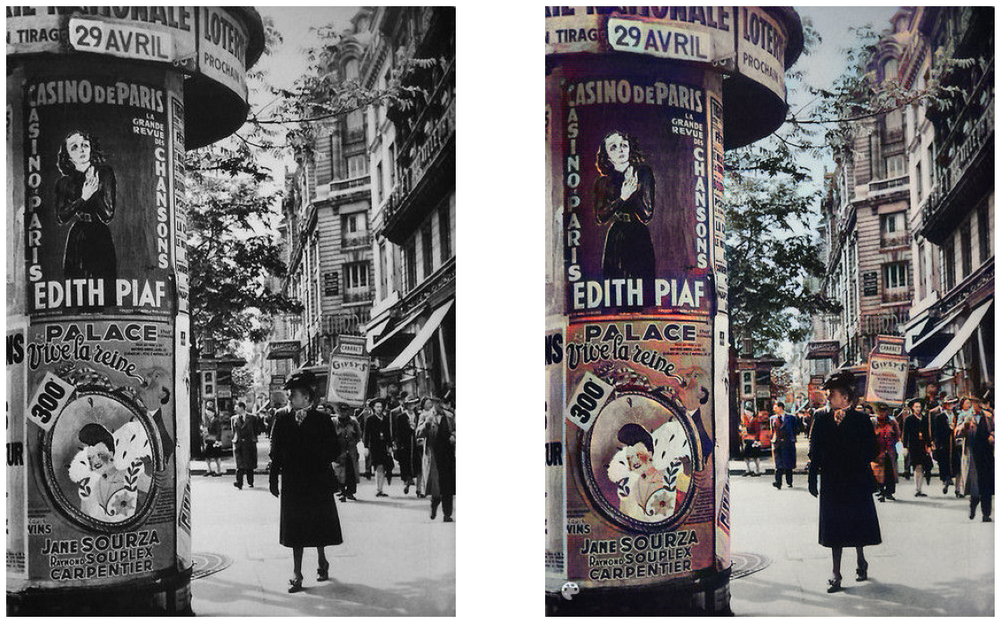

In [45]:
image_colorizer(url4, render_factor=30)

In [46]:
save_results(localfilename)

Saving image results into: ../colorized_ParisBoulevard.jpg
Done.


### Example 3

Done. Local image is available: EiffelTower.jpg


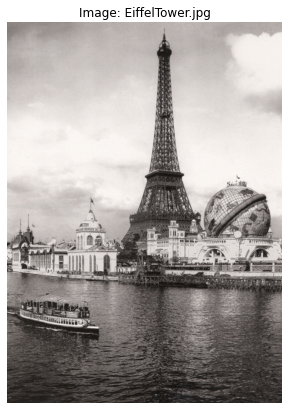

In [47]:
localfilename = "EiffelTower.jpg"
download_image_from_url(url5, localfilename)

Let's colorize the image...

Done in 2.18 seconds with render_factor value = 30


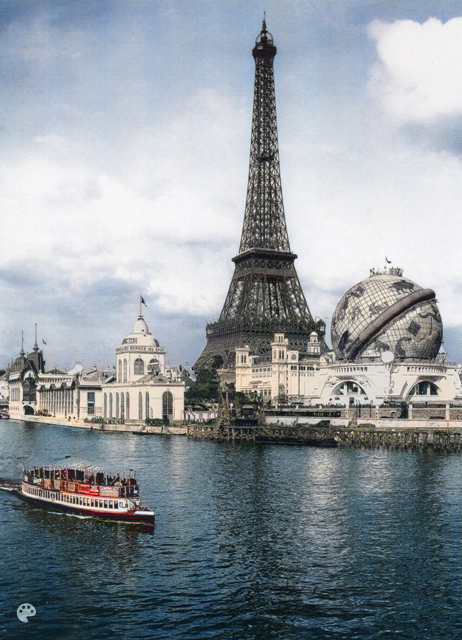

PosixPath('result_images/image.png')

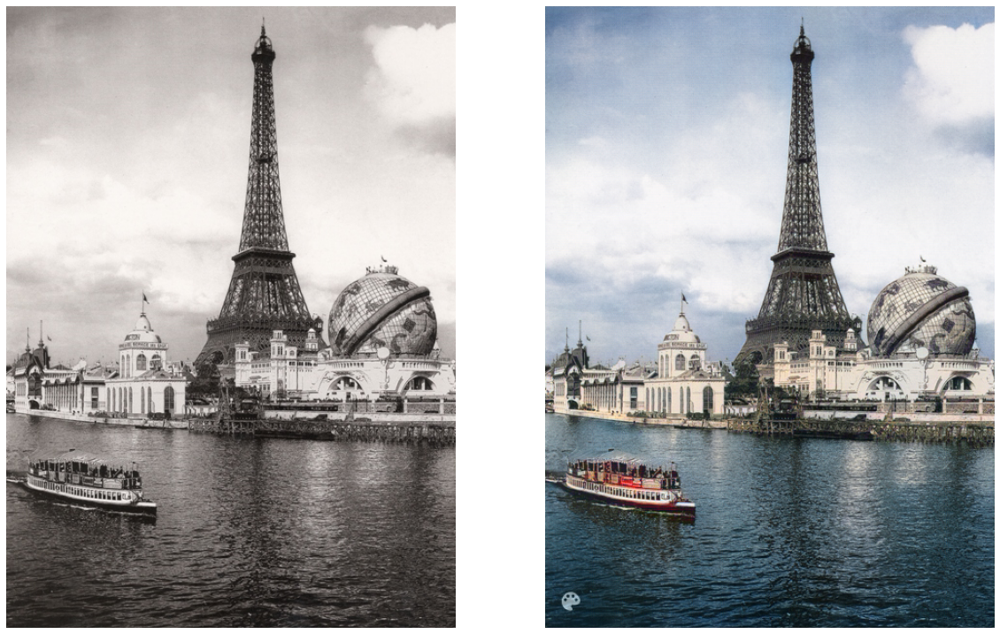

In [48]:
image_colorizer(url5, render_factor=30)

In [49]:
save_results(localfilename)

Saving image results into: ../colorized_EiffelTower.jpg
Done.


## 8. Testing with the video model

We will try to colorize a 1895 movie.

*L'arrivée d'un train en gare de La Ciotat* (translated from French into English as *The Arrival of a Train at La Ciotat Station*, *Arrival of a Train at La Ciotat (US)* and *The Arrival of the Mail Train*, and in the United Kingdom as *Train Pulling into a Station*) is an **1895 French short documentary film directed and produced by Auguste and Louis Lumière**.<br><br>
Contrary to myth, it was not shown at the Lumières' first public film screening on 28 December 1895 in Paris, France: the programme of ten films shown that day makes no mention of it. **Its first public showing took place in January 1896**. It is indexed as Lumière No. 653.

In [50]:
try:
    print("Downloading the Video model...")
    !wget https://data.deepai.org/deoldify/ColorizeVideo_gen.pth -O ./models/ColorizeVideo_gen.pth --no-check-certificate
    print("Done")

except:
    print("[Error] Cannot download the Video model from:", model_url)

--2022-10-24 09:03:28--  https://data.deepai.org/deoldify/ColorizeVideo_gen.pth
Resolving data.deepai.org (data.deepai.org)... 5.9.140.253
Connecting to data.deepai.org (data.deepai.org)|5.9.140.253|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 874066230 (834M) [application/octet-stream]
Saving to: ‘./models/ColorizeVideo_gen.pth’

./models/ColorizeVi 100%[===================>] 833.57M   111MB/s    in 7.6s    

2022-10-24 09:03:35 (110 MB/s) - ‘./models/ColorizeVideo_gen.pth’ saved [874066230/874066230]

Done


In [51]:
!ls models/ColorizeVideo_gen.pth -lh

-rwxrwxrwx 1 root root 834M Oct 24 09:03 models/ColorizeVideo_gen.pth


In [52]:
try:
    print("Loading the Video model...")
    colorizer = get_video_colorizer()
    print("Done")

except:
    print("[Error] Cannot load the Video model")

Loading the Video model...
Done


In [53]:
def colorize_video(url, file, render_factor=35):
    """
    Colorize video file
    """
    watermarked = False
    start = time.time()
    print("\033[1;31;34m")
    print(datetime.datetime.now(), "Starting to colorize the video:", url,
          "\nUsing render factor value =", render_factor, "\n\033[0m")

    video_path = colorizer.colorize_from_url(url,
                                             file,
                                             render_factor,
                                             watermarked=watermarked)

    print("\nDone in", round((time.time() - start) / 60, 2), "minutes")

This will download the video from the url and will colorize it

In [54]:
# Checking if ffmpeg is installed
!ffmpeg -version

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enabl

In [55]:
video_url = "https://www.youtube.com/watch?v=MT-70ni4Ddo"
local_video = "video_train_en_gare_de_la_ciotat.mp4"

print("Starting to colorize the video:", local_video, "\n")

try:
    colorize_video(video_url, local_video)
    print("\nDone.")

except:
    print("[Error] Cannot colorize the video.")

Starting to colorize the video: video_train_en_gare_de_la_ciotat.mp4 


2022-10-24 09:04:06.531553 Starting to colorize the video: https://www.youtube.com/watch?v=MT-70ni4Ddo 
Using render factor value = 35 

[youtube] MT-70ni4Ddo: Downloading webpage
[youtube] MT-70ni4Ddo: Downloading android player API JSON
[info] MT-70ni4Ddo: Downloading 1 format(s): 136+140
[download] Destination: video/source/video_train_en_gare_de_la_ciotat.f136.mp4
[download] 100% of    5.29MiB in 00:00:00 at 13.43MiB/s  
[download] Destination: video/source/video_train_en_gare_de_la_ciotat.f140.m4a
[download] 100% of  737.22KiB in 00:00:00 at 3.13MiB/s   
[Merger] Merging formats into "video/source/video_train_en_gare_de_la_ciotat.mp4"
Deleting original file video/source/video_train_en_gare_de_la_ciotat.f140.m4a (pass -k to keep)
Deleting original file video/source/video_train_en_gare_de_la_ciotat.f136.mp4 (pass -k to keep)


Video created here: video/result/video_train_en_gare_de_la_ciotat.mp4

Done in 28.21 minutes

Done.


### Let's do some video processing to create a side by side video

In [59]:
print("Sources videos:")
!ls video/source/*.mp4 -lh

print("\nResults videos:")
!ls video/result/*.mp4 -lh

Sources videos:
-rwxrwxrwx 1 root root 6.1M Feb  6  2020 video/source/video_train_en_gare_de_la_ciotat.mp4

Results videos:
-rwxrwxrwx 1 root root 31M Oct 24 09:32 video/result/video_train_en_gare_de_la_ciotat.mp4
-rwxrwxrwx 1 root root 31M Oct 24 09:31 video/result/video_train_en_gare_de_la_ciotat_no_audio.mp4


In [60]:
source = "video/source/video_train_en_gare_de_la_ciotat.mp4"
result = "video/result/video_train_en_gare_de_la_ciotat_no_audio.mp4"  
final = "../colorized_video_train_en_gare_de_la_ciotat.mp4"

In [61]:
print("Video information:", source)
fps = VideoFileClip(source).fps
duration = VideoFileClip(source).duration
totalframes = round(fps * duration)

print("\nVideo FPS =", fps)
print("Video Duration =", duration, "seconds")
print("Total number of frames =", totalframes)

Video information: video/source/video_train_en_gare_de_la_ciotat.mp4

Video FPS = 18.0
Video Duration = 46.6 seconds
Total number of frames = 839


In [62]:
start = time.time()
print(datetime.datetime.now(), 
      "Generating the side by side video:",
      final, "\n")

try:
    clips_array([[VideoFileClip(source),
                  VideoFileClip(result)]]).write_videofile(final)
    print("\nDone in", round((time.time() - start), 2), "sec")

except:
    print("[Error] Cannot generate the video")

2022-10-24 09:32:33.226143 Generating the side by side video: ../colorized_video_train_en_gare_de_la_ciotat.mp4 

Moviepy - Building video ../colorized_video_train_en_gare_de_la_ciotat.mp4.
MoviePy - Writing audio in colorized_video_train_en_gare_de_la_ciotatTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ../colorized_video_train_en_gare_de_la_ciotat.mp4



t: 100%|█████████▉| 838/839 [00:20<00:00, 43.01it/s, now=None]

/anaconda/envs/azureml_py38/lib/python3.8/site-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file video/source/video_train_en_gare_de_la_ciotat.mp4, 2077920 bytes wanted but 0 bytes read,at frame 838/839, at time 46.56/46.60 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

/anaconda/envs/azureml_py38/lib/python3.8/site-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file video/result/video_train_en_gare_de_la_ciotat_no_audio.mp4, 2077920 bytes wanted but 0 bytes read,at frame 838/839, at time 46.56/46.56 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready ../colorized_video_train_en_gare_de_la_ciotat.mp4

Done in 22.06 sec


In [63]:
!ls ../colorized_video_train_en_gare_de_la_ciotat.mp4 -lh

-rwxrwxrwx 1 root root 22M Oct 24 09:32 ../colorized_video_train_en_gare_de_la_ciotat.mp4


### Displaying some colorized frames

In [64]:
def view_colorized_frame(framenb):
    """
    Displaying initial and processed video frame using a frame number
    """
    if framenb > totalframes or framenb <= 0:
        print("Choose a valid frame number < ", totalframes)

    else:
        f, ax = plt.subplots(1, 2, figsize=(16, 6))
        ax[0].imshow(plt.imread("video/bwframes/video_train_en_gare_de_la_ciotat/" +\
                            f"{framenb:05}.jpg"))
        ax[1].imshow(plt.imread("video/colorframes/video_train_en_gare_de_la_ciotat/" +\
                            f"{framenb:05}.jpg"))
        ax[0].set_title("Initial frame #" + f"{framenb:05}",
                        fontsize=15)
        ax[1].set_title("Colorized frame #" + f"{framenb:05}",
                        fontsize=15)
        plt.tight_layout()

        plt.savefig("../videoframe_" + f"{framenb:05}" + ".jpg")

        plt.show()

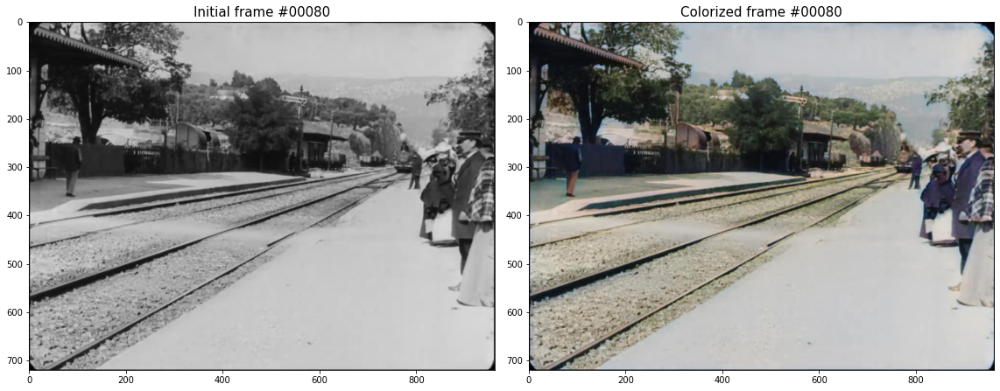

In [65]:
view_colorized_frame(80)

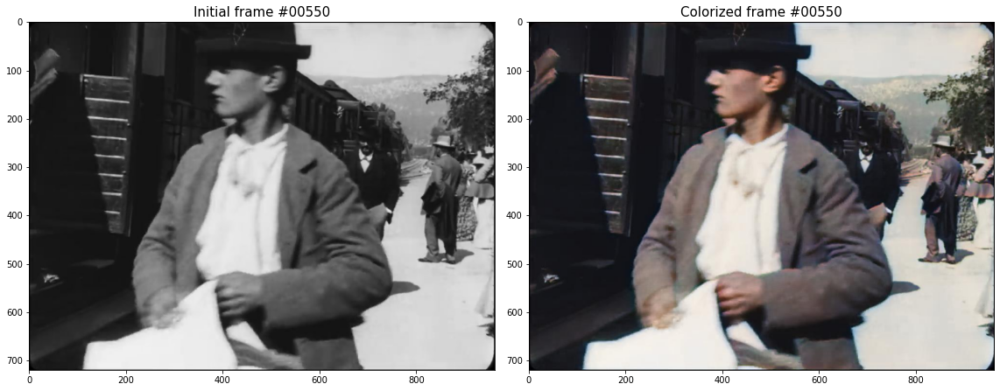

In [66]:
view_colorized_frame(550)

### Playing the video result

In [67]:
from ipywidgets import Video

print("L'arrivée d'un train en gare de La Ciotat (Louis Lumière 1895)")
print("\n\033[1;31;34mInitial video:", 
      "\t" * 7,
      "\033[1;31;32mColorized video:")

Video.from_file(final, width=1024, height=512)

L'arrivée d'un train en gare de La Ciotat (Louis Lumière 1895)

Initial video: 							 Colorized video:


Video(value=b'\x00\x00\x00 ftypisom\x00\x00\x02\x00isomiso2avc1mp41\x00\x00\x00\x08free\x01Z\xad:mdat\x00\x00\…

> End of notebook